In [1]:
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Dropout,Flatten,Dense
from keras.optimizers import Adam
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import random
import os
import ntpath

In [2]:
datadir='Data'
columns=['center','left','right','steering','throttle','reverse','speed']
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)

In [3]:

data.head()

,center,left,right,steering,throttle,reverse,speed
0,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,0.00,1.0,0,30.19034
1,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,0.00,1.0,0,30.19027
2,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,0.00,1.0,0,30.18982
3,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,0.00,1.0,0,30.19034
4,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,E:\COURSERA CERTIFICATE\A complete course on A...,-0.15,1.0,0,30.18423


In [4]:
def path_leaf(path):
    head,tail=ntpath.split(path)
    return tail
data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2023_05_02_02_07_53_673.jpg,left_2023_05_02_02_07_53_673.jpg,right_2023_05_02_02_07_53_673.jpg,0.00,1.0,0,30.19034
1,center_2023_05_02_02_07_53_740.jpg,left_2023_05_02_02_07_53_740.jpg,right_2023_05_02_02_07_53_740.jpg,0.00,1.0,0,30.19027
2,center_2023_05_02_02_07_53_807.jpg,left_2023_05_02_02_07_53_807.jpg,right_2023_05_02_02_07_53_807.jpg,0.00,1.0,0,30.18982
3,center_2023_05_02_02_07_53_882.jpg,left_2023_05_02_02_07_53_882.jpg,right_2023_05_02_02_07_53_882.jpg,0.00,1.0,0,30.19034
4,center_2023_05_02_02_07_53_959.jpg,left_2023_05_02_02_07_53_959.jpg,right_2023_05_02_02_07_53_959.jpg,-0.15,1.0,0,30.18423


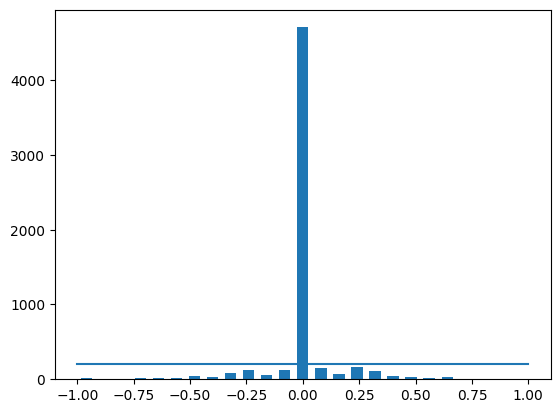

In [5]:
num_bins=25
sample_per_bin=200
hist,bins=np.histogram(data['steering'],num_bins)
center=(bins[:-1]+bins[1:])*0.5
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(sample_per_bin,sample_per_bin))

total data: 5852
removed 4506
remaining: 1346


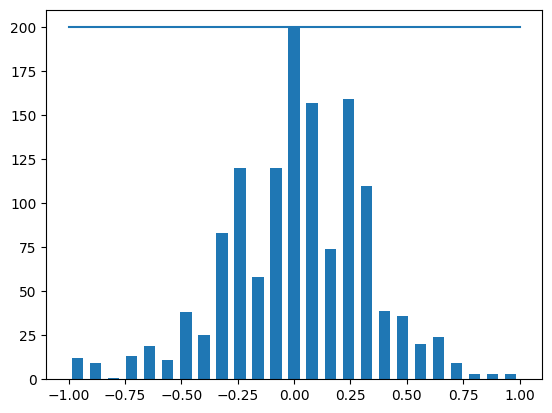

In [6]:
print('total data:',len(data))
remove_list=[]
for j in range(num_bins):
    list_=[]
    for i in range(len(data['steering'])):
        if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
            list_.append(i)
    list_=shuffle(list_)
    list_=list_[sample_per_bin:]
    remove_list.extend(list_)
print('removed',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('remaining:',len(data))

hist,_=np.histogram(data['steering'],(num_bins))
plt.bar(center,hist,width=0.05)
plt.plot((np.min(data['steering']),np.max(data['steering'])),(sample_per_bin,sample_per_bin))

In [7]:
print(data.iloc[1])
def load_img_steering(datadir,df):
    image_path=[]
    steering=[]
    for i in range(len(data)):
        indexed_data=data.iloc[i]
        center,left,right,=indexed_data[0],indexed_data[1],indexed_data[2]
        image_path.append(os.path.join(datadir,center.strip()))
        steering.append(float(indexed_data[3]))
    image_paths=np.array(image_path)
    steerings=np.array(steering)
    return image_paths,steerings

image_paths,steerings=load_img_steering(datadir+'/IMG',data)


center      center_2023_05_02_02_07_54_025.jpg
left          left_2023_05_02_02_07_54_025.jpg
right        right_2023_05_02_02_07_54_025.jpg
steering                                  -0.3
throttle                                   1.0
reverse                                      0
speed                                 30.16927
Name: 5, dtype: object


In [8]:
X_train,X_valid,y_train,y_valid=train_test_split(image_paths,steerings,test_size=0.2,random_state=1)
print('Training Samples:{}\nVaild Samples:{}'.format(len(X_train),len(X_valid)))

Training Samples:1076
Vaild Samples:270


Text(0.5, 1.0, 'Validation set')

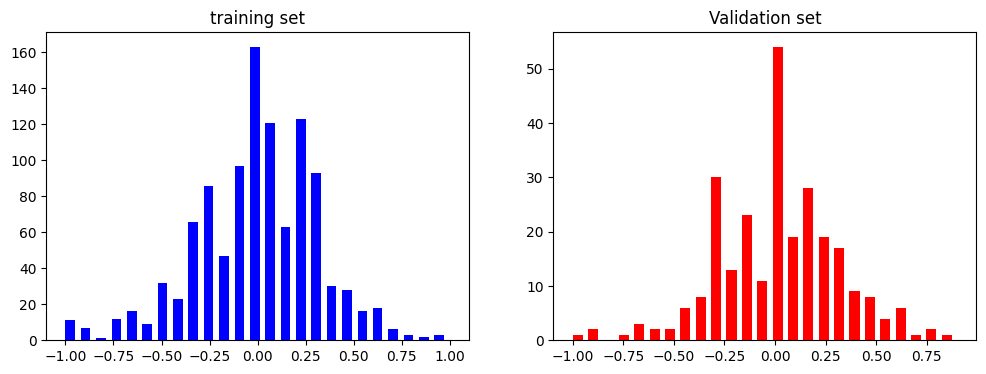

In [9]:
fig,axes=plt.subplots(1,2,figsize=(12,4))
axes[0].hist(y_train,bins=num_bins,width=0.05,color='blue')
axes[0].set_title('training set')
axes[1].hist(y_valid,bins=num_bins,width=0.05,color='red')
axes[1].set_title('Validation set')



In [10]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

Text(0.5, 1.0, 'Zoomed Image')

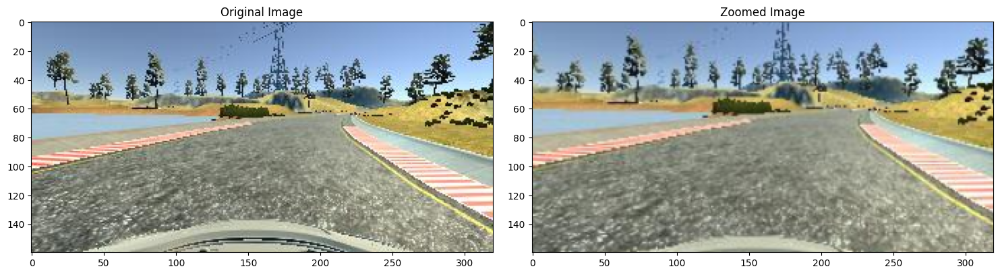

In [11]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [12]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

Text(0.5, 1.0, 'Panned Image')

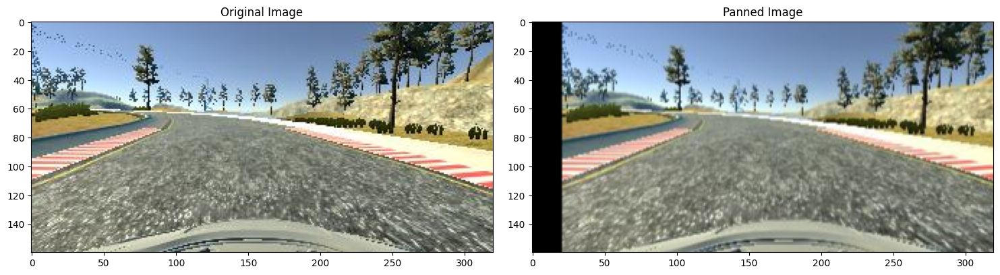

In [13]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [14]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness altered image ')

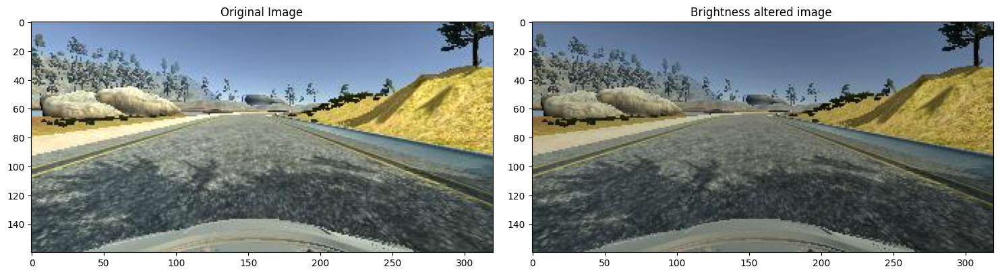

In [15]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

In [16]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.2')

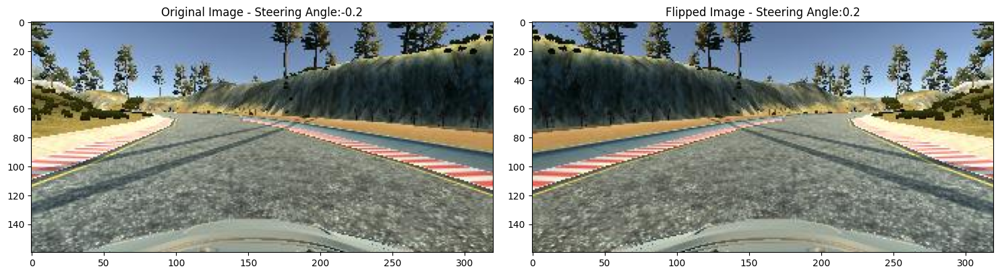

In [17]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

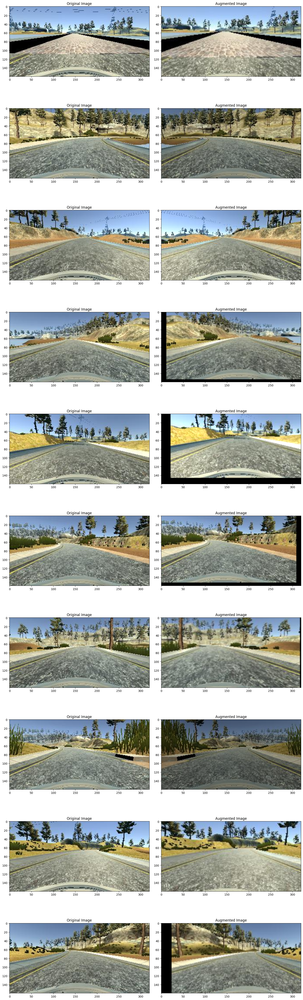

In [18]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")
 

In [19]:
def img_preprocess(img):
    img=img[60:135,:,:]
    img=cv2.cvtColor(img,cv2.COLOR_RGB2YUV)
    img=cv2.GaussianBlur(img,(3,3),0)
    img=cv2.resize(img,(200,66))
    img=img/255
    return img

Text(0.5, 1.0, 'Preprocess Image')

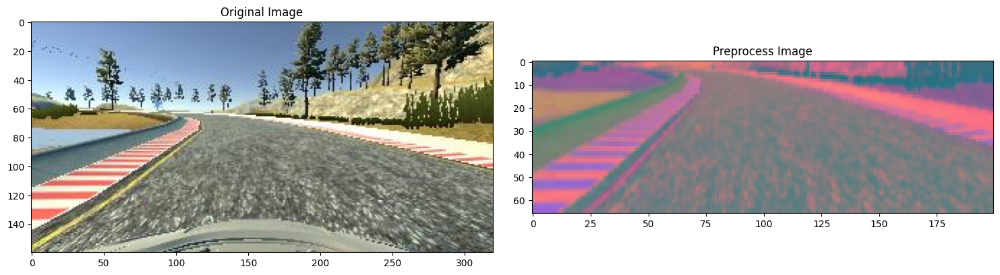

In [20]:
image=image_paths[100]
original_image=mpimg.imread(image)
preprocessed_image=img_preprocess(original_image)

fig,axs=plt.subplots(1,2,figsize=(15,10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocess Image')

In [21]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))  



Text(0.5, 1.0, 'Validation Image')

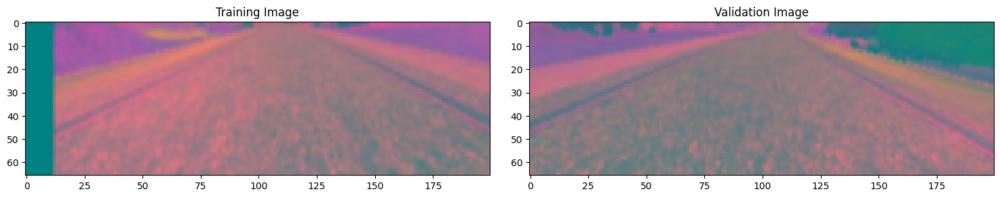

In [22]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [23]:
# X_train=np.array(list(map(img_preprocess,X_train)))
# X_valid=np.array(list(map(img_preprocess,X_valid)))

TypeError: string indices must be integers, not 'tuple'

TypeError: Image data of dtype <U43 cannot be converted to float

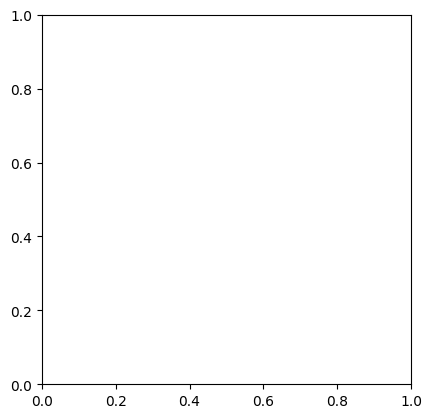

In [24]:
# plt.imshow(X_train[random.randint(0,len(X_train)-1)])
# plt.axis('off')
# print(X_train.shape)

In [25]:
def nvidia_model():
 
    model = Sequential()
    
    model.add(Conv2D(24, kernel_size=(5,5), strides=(2,2), input_shape=(66,200,3),activation='elu'))
    
    model.add(Conv2D(36, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(48, kernel_size=(5,5), strides=(2,2), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    model.add(Conv2D(64, kernel_size=(3,3), activation='elu'))
    #model.add(Dropout(0.5))
    
    
    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    #model.add(Dropout(0.5))
    
    
    model.add(Dense(50, activation='elu'))
    #model.add(Dropout(0.5))
    model.add(Dense(10, activation ='elu'))
    #model.add(Dropout(0.5))
    model.add(Dense(1))
    
    
    optimizer= Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    
    return model

In [26]:
model=nvidia_model()
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

c:\Users\kashyap\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [27]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

C:\Users\kashyap\AppData\Local\Temp\ipykernel_10544\1774700600.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 145s 482ms/step - loss: 0.1794 - val_loss: 0.0870
Epoch 2/10
300/300 [==============================] - 136s 454ms/step - loss: 0.0922 - val_loss: 0.0631
Epoch 3/10
300/300 [==============================] - 147s 492ms/step - loss: 0.0752 - val_loss: 0.0521
Epoch 4/10
300/300 [==============================] - 148s 494ms/step - loss: 0.0686 - val_loss: 0.0469
Epoch 5/10
300/300 [==============================] - 144s 482ms/step - loss: 0.0598 - val_loss: 0.0438
Epoch 6/10
300/300 [==============================] - 149s 499ms/step - loss: 0.0547 - val_loss: 0.0408
Epoch 7/10
300/300 [==============================] - 152s 507ms/step - loss: 0.0500 - val_loss: 0.0342
Epoch 8/10
300/300 [==============================] - 144s 480ms/step - loss: 0.0455 - val_loss: 0.0350
Epoch 9/10
300/300 [==============================] - 144s 481ms/step - loss: 0.0435 - val_loss: 0.0333
Epoch 10/10
300/300 [==============================] - 144s 480m

In [ ]:
#history=model.fit(X_train,y_train,epochs=30,validation_data=(X_valid,y_valid),batch_size=100,verbose=1,shuffle=1)

Epoch 1/30
11/11 [==============================] - 3s 203ms/step - loss: 0.5440 - val_loss: 0.0900
Epoch 2/30
11/11 [==============================] - 2s 184ms/step - loss: 0.1740 - val_loss: 0.0845
Epoch 3/30
11/11 [==============================] - 2s 180ms/step - loss: 0.1318 - val_loss: 0.0846
Epoch 4/30
11/11 [==============================] - 2s 192ms/step - loss: 0.1181 - val_loss: 0.0761
Epoch 5/30
11/11 [==============================] - 2s 169ms/step - loss: 0.1003 - val_loss: 0.0799
Epoch 6/30
11/11 [==============================] - 2s 167ms/step - loss: 0.1090 - val_loss: 0.0720
Epoch 7/30
11/11 [==============================] - 2s 168ms/step - loss: 0.0949 - val_loss: 0.0672
Epoch 8/30
11/11 [==============================] - 2s 170ms/step - loss: 0.0885 - val_loss: 0.0642
Epoch 9/30
11/11 [==============================] - 2s 175ms/step - loss: 0.0911 - val_loss: 0.0623
Epoch 10/30
11/11 [==============================] - 2s 167ms/step - loss: 0.0832 - val_loss: 0.0584

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

Text(0.5, 0, 'epoch')

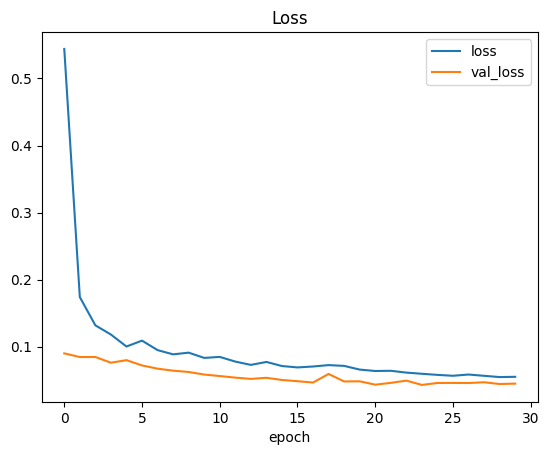

In [ ]:
# plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
# plt.legend(['loss', 'val_loss'])
# plt.title('Loss')
# plt.xlabel('epoch')

In [ ]:
model.save("C:\\Users\\kashyap\\Desktop\\behavioural clonning\\env\\model.h6")